# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Write your Algorithm
* [Step 6](#step6): Test Your Algorithm

---

## Libraries imports

In [6]:
import numpy as np
from glob import glob
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline 

from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision import datasets
import torch.optim as optim

from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

import os
import numpy as np
import collections
import random

In [7]:
# check if CUDA is available
use_cuda = torch.cuda.is_available()

<a id='step0'></a>
## Step 0: Import Datasets

Make sure that you've downloaded the required human and dog datasets:

**Note: if you are using the Udacity workspace, you *DO NOT* need to re-download these - they can be found in the `/data` folder as noted in the cell below.**

* Download the [dog dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip).  Unzip the folder and place it in this project's home directory, at the location `/dog_images`. 

* Download the [human dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip).  Unzip the folder and place it in the home directory, at location `/lfw`.  

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [8]:
# load filenames for human and dog images
human_files = np.array(glob("/data/lfw/*/*"))
dog_files = np.array(glob("/data/dog_images/*/*/*"))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 8351 total dog images.


<a id='step1'></a>
## Step 1: Detect Humans

In this section, we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  

OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.  In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

Number of faces detected: 1


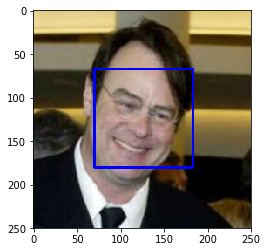

In [9]:
# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[0])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [10]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

In [11]:
human_files_short = human_files[:100]
dog_files_short = dog_files[:100]

#-#-# Do NOT modify the code above this line. #-#-#

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.

human_human_predictions = 0
for human_image in human_files_short:
    if face_detector(human_image):
        human_human_predictions +=1
        
dog_human_predictions = 0
for dog_image in dog_files_short:
    if face_detector(dog_image):
        dog_human_predictions += 1
        
print(f"{human_human_predictions}% photos contain humans in humans files")
print(f"{dog_human_predictions}% photos contain humans in dogs files")

98% photos contain humans in humans files
17% photos contain humans in dogs files


__Answer:__ 

* 98% photos contain humans in humans files
* 17% photos contain humans in dogs files

We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [14]:
### (Optional) 
### TODO: Test performance of anotherface detection algorithm.
### Feel free to use as many code cells as needed.

---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

In [12]:
# define VGG16 model
VGG16 = models.vgg16(pretrained=True)

# move model to GPU if CUDA is available
if use_cuda:
    VGG16 = VGG16.cuda()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.torch/models/vgg16-397923af.pth
100%|██████████| 553433881/553433881 [00:05<00:00, 105103622.38it/s]


Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

### (IMPLEMENTATION) Making Predictions with a Pre-trained Model

In the next code cell, you will write a function that accepts a path to an image (such as `'dogImages/train/001.Affenpinscher/Affenpinscher_00001.jpg'`) as input and returns the index corresponding to the ImageNet class that is predicted by the pre-trained VGG-16 model.  The output should always be an integer between 0 and 999, inclusive.

Before writing the function, make sure that you take the time to learn  how to appropriately pre-process tensors for pre-trained models in the [PyTorch documentation](http://pytorch.org/docs/stable/torchvision/models.html).

In [13]:
def VGG16_predict(img_path):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to VGG-16 model's prediction
    '''
    
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image
      
    image = Image.open(img_path)
    
    preparer = transforms.Compose([transforms.CenterCrop(224), 
                                   transforms.ToTensor(),
                                   transforms.Normalize(mean = [0.485, 0.456, 0.406],
                                                        std = [0.229, 0.224, 0.225])])
    
    prepared_image = preparer(image)
    image_batch = torch.unsqueeze(prepared_image, 0)
    
    if use_cuda:
        image_batch = image_batch.cuda()

    output = VGG16(image_batch)
    
    return torch.argmax(output).item() # predicted class index

In [14]:
VGG16_predict(human_files_short[0])

906

### (IMPLEMENTATION) Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268 (inclusive).

Use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [15]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    ## TODO: Complete the function.
    
    predicted_label = VGG16_predict(img_path) 
    
    if predicted_label > 150 and predicted_label < 269:
        return True # true/false
    
    return False

### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

In [16]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.

human_detected_dogs = 0
for human_image in human_files_short:
    if dog_detector(human_image):
        human_detected_dogs +=1
        
dog_detected_dogs = 0
for dog_image in dog_files_short:
    if dog_detector(dog_image):
        dog_detected_dogs += 1
        
print(f"{human_detected_dogs}% photos contain dogs in humans files")
print(f"{dog_detected_dogs}% photos contain dogs in dogs files")

2% photos contain dogs in humans files
90% photos contain dogs in dogs files


__Answer:__ 

* 2% photos contain dogs in humans files
* 90% photos contain dogs in dogs files

We suggest VGG-16 as a potential network to detect dog images in your algorithm, but you are free to explore other pre-trained networks (such as [Inception-v3](http://pytorch.org/docs/master/torchvision/models.html#inception-v3), [ResNet-50](http://pytorch.org/docs/master/torchvision/models.html#id3), etc).  Please use the code cell below to test other pre-trained PyTorch models.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [21]:
### (Optional) 
### TODO: Report the performance of another pre-trained network.
### Feel free to use as many code cells as needed.

---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dog_images/train`, `dog_images/valid`, and `dog_images/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [17]:
dog_files = np.array(glob("/data/dog_images/*/*/*"))
            
print(f"Total number of dog images in folders: {len(dog_files)}")

Total number of dog images in folders: 8351


*Checking image dimensions*

In [18]:
dimensions = []

for file in tqdm(dog_files):
    image = Image.open(file)
    dimensions.append(image.size)
    
counter = collections.Counter(dimensions)
counter.most_common(20)

100%|██████████| 8351/8351 [00:09<00:00, 887.71it/s]


[((640, 480), 476),
 ((500, 375), 442),
 ((480, 640), 283),
 ((500, 333), 200),
 ((640, 427), 116),
 ((375, 500), 116),
 ((427, 640), 82),
 ((333, 500), 76),
 ((800, 600), 74),
 ((400, 300), 67),
 ((1024, 768), 54),
 ((600, 450), 46),
 ((640, 426), 44),
 ((500, 500), 43),
 ((1600, 1200), 40),
 ((300, 400), 31),
 ((500, 332), 30),
 ((500, 334), 30),
 ((300, 300), 29),
 ((640, 425), 29)]

*Checking how many breeds of dogs there are to know the size of the output*

In [19]:
breeds = os.listdir("/data/dog_images/train")
len(breeds)

133

In [20]:
breeds

['103.Mastiff',
 '059.Doberman_pinscher',
 '055.Curly-coated_retriever',
 '031.Borzoi',
 '024.Bichon_frise',
 '049.Chinese_crested',
 '067.Finnish_spitz',
 '130.Welsh_springer_spaniel',
 '019.Bedlington_terrier',
 '115.Papillon',
 '126.Saint_bernard',
 '013.Australian_terrier',
 '116.Parson_russell_terrier',
 '107.Norfolk_terrier',
 '133.Yorkshire_terrier',
 '032.Boston_terrier',
 '108.Norwegian_buhund',
 '028.Bluetick_coonhound',
 '066.Field_spaniel',
 '129.Tibetan_mastiff',
 '005.Alaskan_malamute',
 '102.Manchester_terrier',
 '034.Boxer',
 '068.Flat-coated_retriever',
 '089.Irish_wolfhound',
 '104.Miniature_schnauzer',
 '035.Boykin_spaniel',
 '080.Greater_swiss_mountain_dog',
 '007.American_foxhound',
 '112.Nova_scotia_duck_tolling_retriever',
 '025.Black_and_tan_coonhound',
 '072.German_shorthaired_pointer',
 '062.English_setter',
 '029.Border_collie',
 '045.Cardigan_welsh_corgi',
 '105.Neapolitan_mastiff',
 '076.Golden_retriever',
 '063.English_springer_spaniel',
 '078.Great_dane',

*Visualizing some images to know how to prepare them to output*

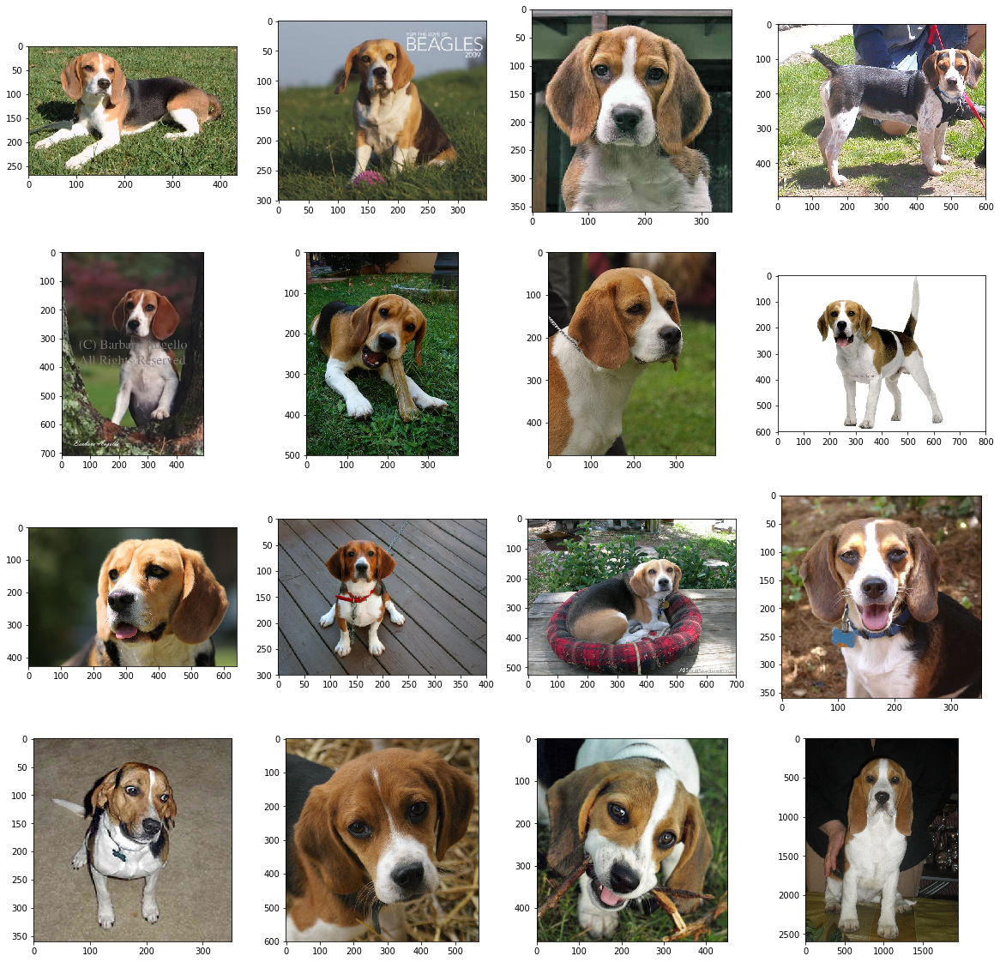

In [21]:
images = np.array(glob("/data/dog_images/*/016.Beagle/*"))

fig = plt.figure(figsize = (20,20))

for index, image in enumerate(images[:16]):
    ax = fig.add_subplot(4, 4, index + 1)
    plt.imshow(Image.open(image))

In [22]:
example_transformation = transforms.Compose([transforms.Resize(256), 
                                             transforms.RandomCrop(256)])

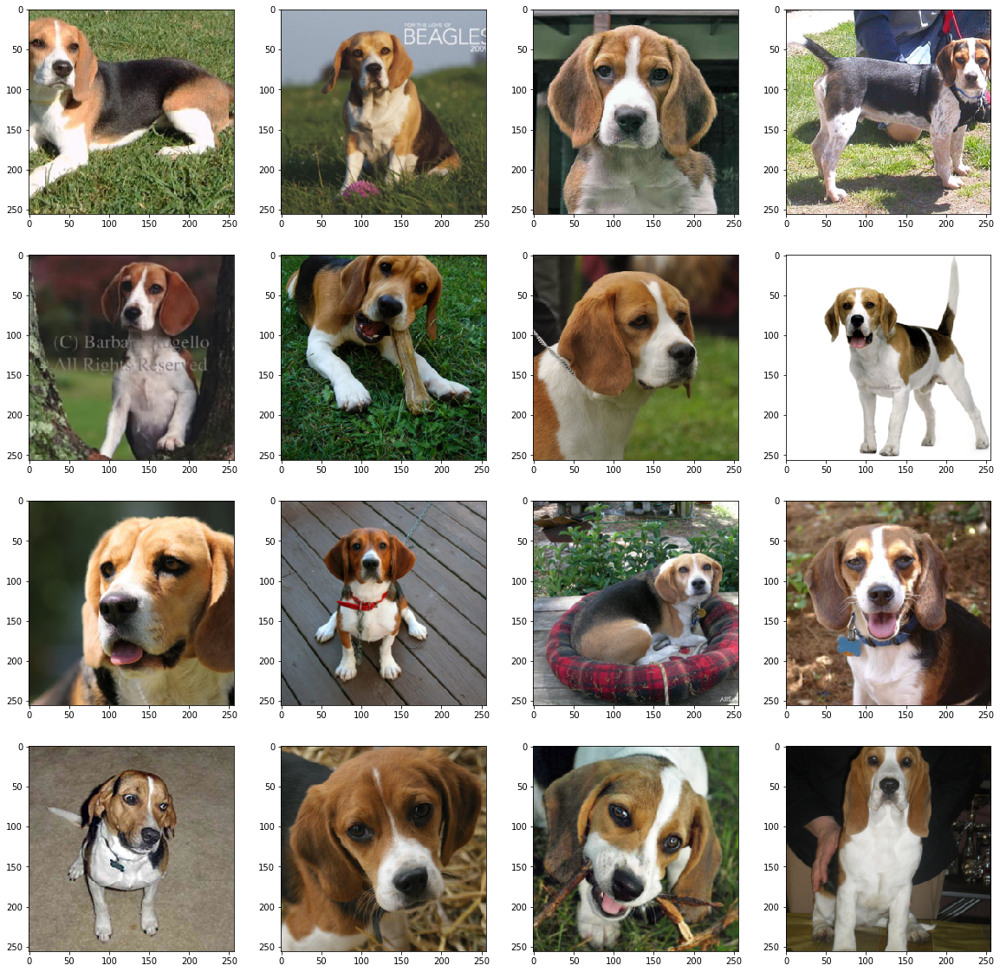

In [23]:
fig = plt.figure(figsize = (20,20))

for index, image in enumerate(images[:16]):
    
    img = Image.open(image).convert('RGB')
    img_transformed = example_transformation(img)

    ax = fig.add_subplot(4, 4, index + 1)
    plt.imshow(img_transformed)

In [24]:
### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

data_transform = transforms.Compose([transforms.Resize(224), 
                                     transforms.RandomCrop(224),
                                     transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                              std=[0.229, 0.224, 0.225])])


train_dir = "/data/dog_images/train" 
val_dir = "/data/dog_images/valid"
test_dir = "/data/dog_images/test"

train_data = datasets.ImageFolder(train_dir, transform = data_transform)
val_data = datasets.ImageFolder(val_dir, transform = data_transform)
test_data = datasets.ImageFolder(test_dir, transform = data_transform)

# Number of images on each folder
print(f"Train images: {len(train_data)}")
print(f"Validation images: {len(val_data)}")
print(f"Test images: {len(test_data)}")

Train images: 6680
Validation images: 835
Test images: 836


In [25]:
# define dataloader parameters
batch_size = 20
num_workers=0

# prepare data loaders
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

val_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size, 
                                          num_workers=num_workers, shuffle=True)

test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, 
                                          num_workers=num_workers, shuffle=True)

loaders_scratch = {"train": train_loader, "valid": val_loader, "test": test_loader}

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


**Answer**:

* Since images are different sizes, it was necessary to resize them. The chosen size was (224, 224) since that's the input size of the VGG network. The resizing was done in two steps, first the image was scaled to a 224 maximum side and then it was cropped randomly to get a square input. After that, we normalized the data.

* I decided not to augment the dataset because images are pretty diverse across all the breeds. The network is already receiving some dogs rotated and in weird positions so data augmentation should not be crucial in this step.

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

In [31]:
# define the CNN architecture
class Net(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self):
        super(Net, self).__init__()
        ## Define layers of a CNN
        
        #Three conv layers with padding
        self.conv1 = nn.Conv2d(3, 16, 3, padding = 1)
        self.conv2 = nn.Conv2d(16, 32, 3, padding = 1)
        self.conv3 = nn.Conv2d(32, 64, 3, padding = 1)
        
        #dropout layer after each convolution layer
        self.dropout = nn.Dropout(0.25)
        
        #maxpooling for dimension reduction of layers
        self.pool = nn.MaxPool2d(2, 2)
        
        #batch normalization to apply after the first linear layer
        self.batch_normalization = nn.BatchNorm1d(num_features=5000)

        #after extracting the features, two linear layers
        self.fc1 = nn.Linear(64 * 28 * 28, 5000)
        self.fc2 = nn.Linear(5000, 500)
        self.fc3 = nn.Linear(500, 133)


    def forward(self, x):
        ## Define forward behavior
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        x = x.view(-1, 64 * 28 * 28)

        x = self.batch_normalization(F.relu(self.fc1(x)))
        x = self.dropout(x)
        x = self.fc2(x)
        x = self.dropout(x)
        x = self.fc3(x)
        
        return x

#-#-# You so NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()

# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()

In [32]:
model_scratch

Net(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (dropout): Dropout(p=0.25)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (batch_normalization): BatchNorm1d(5000, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_features=50176, out_features=5000, bias=True)
  (fc2): Linear(in_features=5000, out_features=500, bias=True)
  (fc3): Linear(in_features=500, out_features=133, bias=True)
)

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__ 

To design the network I used as a baseline the basic CNN model used on the lectures (CIFAR and MNIST problems)

To extract the image features, the network architecture starts with three convolutional layers with Relu as activation function and a posterior maxpool layer to reduce the dimensions of the filters while getting the most important features. The convolution layers output 16, 32 and 64 filters respectively.

```
Input dimensions: (224, 224, 3)
First convolution and MaxPool: (224, 224, 3) -> (112, 112, 16)
Second convolution and MaxPool: (112, 112, 16) -> (56, 56, 32)
Third convolution and MaxPool:  (56, 56, 32) -> (28, 28, 64)
```

After the feature extraction we flatten the output as preparation for the linear layers. The input dimensions for this stage is the product of the dimensions of the last MaxPool layer `(28*28*64) = 50176`. The output has to classify 133 classes so we gradually reduce the number of nodes on each posterior linear layer. We also use batch normalization to give more stability to the network on the first linear layer and dropout layers to avoid overfitting.

```
Flatten: (28, 28, 64) -> (1, 50176)
First linear layer: (1, 50176) -> (1, 5000)
Second linear layer: (1. 5000) -> (1, 500)
Third linear layer: (1, 500) -> (1, 133)
```

On the output layer we apply a softmax activation function to convert the numbers to probabilities and get the predicted class. This step is done while optimizing the network with the `CrossEntropyLoss` criterion.

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [33]:
### TODO: select loss function
criterion_scratch = nn.CrossEntropyLoss()

### TODO: select optimizer
optimizer_scratch = optim.SGD(model_scratch.parameters(), lr = 0.0001, momentum = 0.9)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [34]:
def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## find the loss and update the model parameters accordingly
            ## record the average training loss, using something like
            ## train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            
            #reset gradients
            optimizer.zero_grad()
            #forward pass
            output = model(data)
            #calculate loss
            loss = criterion(output, target)
            #backward pass 
            loss.backward()
            #update weights
            optimizer.step()
            #add training loss
            train_loss += loss.item()*data.size(0)
            
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## update the average validation loss
            output = model(data)
            loss = criterion(output, target)
            
            valid_loss += loss.item()*data.size(0)
            
        train_loss = train_loss/len(train_loader.sampler)
        valid_loss = valid_loss/len(val_loader.sampler)
            
        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            train_loss,
            valid_loss
            ))
        
        ## TODO: save the model if validation loss has decreased
        if valid_loss <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'\
                  .format(valid_loss_min, valid_loss))
            
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
        
    # return trained model
    return model

In [35]:
# train the model
model_scratch = train(30, loaders_scratch, model_scratch, optimizer_scratch, 
                      criterion_scratch, use_cuda, 'model_scratch.pt')

Epoch: 1 	Training Loss: 4.796441 	Validation Loss: 4.687496
Validation loss decreased (inf --> 4.687496).  Saving model ...
Epoch: 2 	Training Loss: 4.593170 	Validation Loss: 4.579675
Validation loss decreased (4.687496 --> 4.579675).  Saving model ...
Epoch: 3 	Training Loss: 4.468140 	Validation Loss: 4.497068
Validation loss decreased (4.579675 --> 4.497068).  Saving model ...
Epoch: 4 	Training Loss: 4.372711 	Validation Loss: 4.442518
Validation loss decreased (4.497068 --> 4.442518).  Saving model ...
Epoch: 5 	Training Loss: 4.289272 	Validation Loss: 4.380339
Validation loss decreased (4.442518 --> 4.380339).  Saving model ...
Epoch: 6 	Training Loss: 4.207093 	Validation Loss: 4.351232
Validation loss decreased (4.380339 --> 4.351232).  Saving model ...
Epoch: 7 	Training Loss: 4.135079 	Validation Loss: 4.299082
Validation loss decreased (4.351232 --> 4.299082).  Saving model ...
Epoch: 8 	Training Loss: 4.068774 	Validation Loss: 4.248308
Validation loss decreased (4.29908

In [36]:
# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.

In [37]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))

# call test function    
test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Test Loss: 3.857145


Test Accuracy: 13% (109/836)


---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/master/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively). 

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

In [26]:
## TODO: Specify data loaders
batch_size = 20
num_workers=0

data_transform = transforms.Compose([transforms.Resize(224), 
                                     transforms.RandomCrop(224),
                                     transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                              std=[0.229, 0.224, 0.225])])


train_data = datasets.ImageFolder(train_dir, transform = data_transform)
val_data = datasets.ImageFolder(val_dir, transform = data_transform)
test_data = datasets.ImageFolder(test_dir, transform = data_transform)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, 
                                           num_workers=num_workers, shuffle=True)

val_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size, 
                                          num_workers=num_workers, shuffle=True)

test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, 
                                          num_workers=num_workers, shuffle=True)

loaders_transfer = {"train": train_loader, "valid": val_loader, "test": test_loader}

### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify dog breed.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

In [27]:
## TODO: Specify model architecture 

model_transfer = models.vgg16(pretrained=True)    
model_transfer

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (17): Conv2d

In [28]:
#freezing the parameters used on feature extraction
for param in model_transfer.features.parameters():
    param.requires_grad = False

In [29]:
if use_cuda:
    model_transfer = model_transfer.cuda()

In [30]:
# n_inputs = vgg16.classifier[6].in_features
n_inputs = model_transfer.classifier[6].in_features

# add last linear layer (n_inputs -> 5 flower classes)
# new layers automatically have requires_grad = True
last_layer = nn.Linear(n_inputs, 133)

model_transfer.classifier[6] = last_layer

# if GPU is available, move the model to GPU
if use_cuda:
    model_transfer.cuda()

# check to see that your last layer produces the expected number of outputs
model_transfer

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (17): Conv2d

__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ 

Since we're taking a transfer learning approach, we take advantage of the feature extraction done in the VGG network. That's why we freeze the parameters on the feature extraction step and only train the linear layers of the network. Since the original output has 1000 nodes and there are only 133 breeds, we change the out_features of the last layer accordingly.


### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/master/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/master/optim.html).  Save the chosen loss function as `criterion_transfer`, and the optimizer as `optimizer_transfer` below.

In [43]:
criterion_transfer = nn.CrossEntropyLoss()
optimizer_transfer = optim.SGD(model_transfer.classifier.parameters(), lr = 0.01)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

In [44]:
# train the model

n_epochs = 5
model_transfer = train(n_epochs, loaders_transfer, model_transfer, optimizer_transfer, 
                       criterion_transfer, use_cuda, 'model_transfer.pt')

Epoch: 1 	Training Loss: 1.461593 	Validation Loss: 0.634119
Validation loss decreased (inf --> 0.634119).  Saving model ...
Epoch: 2 	Training Loss: 0.605576 	Validation Loss: 0.527377
Validation loss decreased (0.634119 --> 0.527377).  Saving model ...
Epoch: 3 	Training Loss: 0.436419 	Validation Loss: 0.474161
Validation loss decreased (0.527377 --> 0.474161).  Saving model ...
Epoch: 4 	Training Loss: 0.352162 	Validation Loss: 0.499319
Epoch: 5 	Training Loss: 0.269979 	Validation Loss: 0.444475
Validation loss decreased (0.474161 --> 0.444475).  Saving model ...


In [31]:
# load the model that got the best validation accuracy (uncomment the line below)
model_transfer.load_state_dict(torch.load('model_transfer.pt'))

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 60%.

In [46]:
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Test Loss: 0.522126


Test Accuracy: 85% (715/836)


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan hound`, etc) that is predicted by your model.  

In [69]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.

# list of class names by index, i.e. a name can be accessed like class_names[0]
# class_names = [item[4:].replace("_", " ") for item in data_transfer['train'].classes]
class_names = [item[4:].replace("_", " ") for item in sorted(breeds)]

def predict_breed_transfer(img_path):
    # load the image and return the predicted breed
    image = Image.open(img_path)
    preproc_image = data_transform(image).unsqueeze(0)

    if use_cuda:
        preproc_image = preproc_image.cuda()

    output = model_transfer(preproc_image)
        
    return class_names[torch.argmax(output).item()]

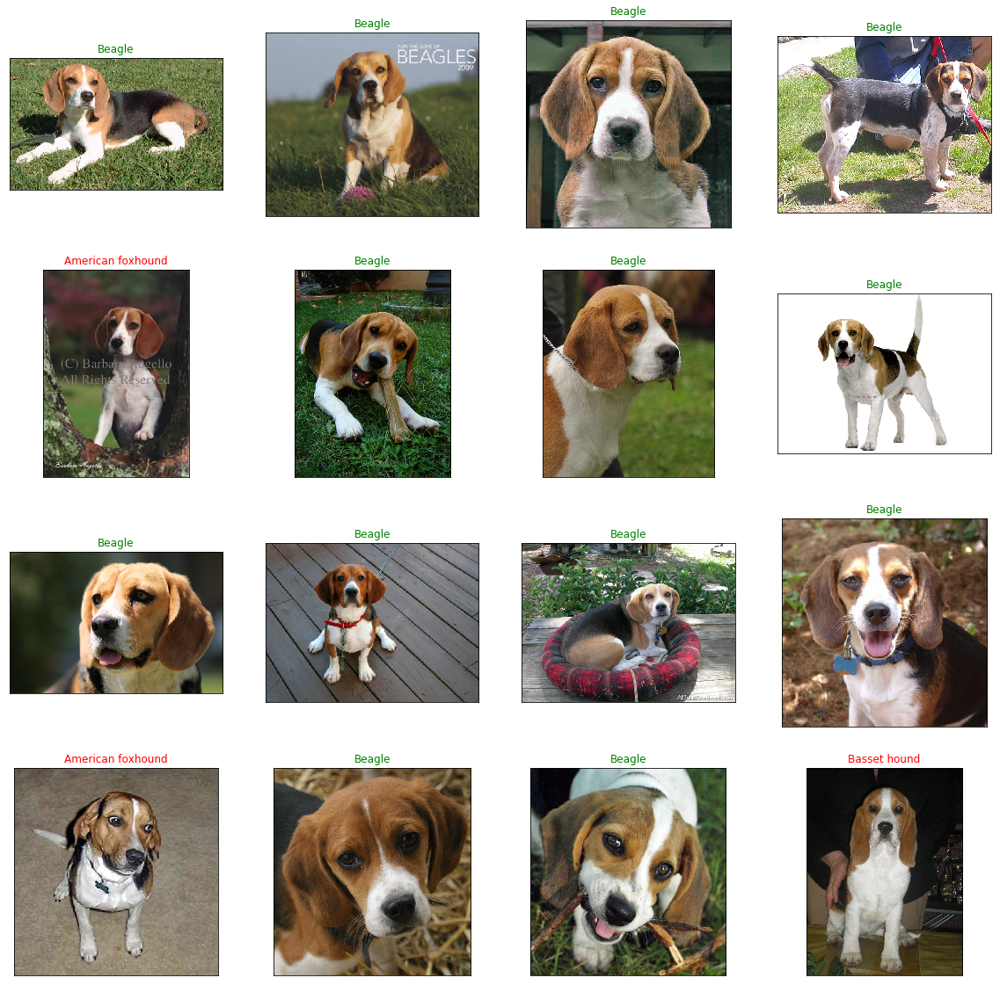

In [70]:
fig = plt.figure(figsize = (20,20))

for index, image in enumerate(images[:16]):
    
    img = Image.open(image).convert('RGB')
    predicted_label = predict_breed_transfer(image)

    ax = fig.add_subplot(4, 4, index + 1, xticks=[], yticks=[])
    plt.imshow(img)
    
    ax.set_title(predicted_label, color=("green" if predicted_label == "Beagle" else "red"))

Some more difficult breeds

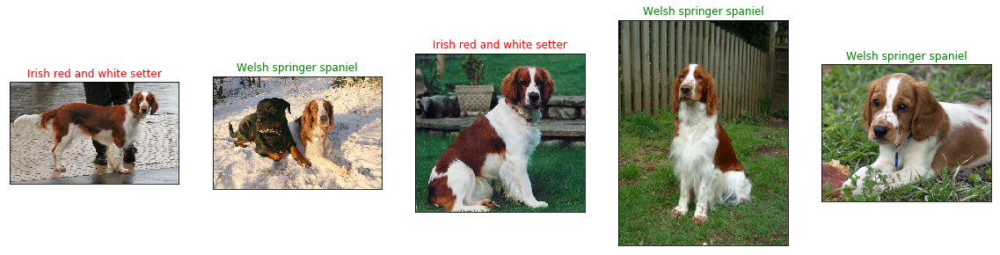

In [71]:
welshs = glob("/data/dog_images/test/130.Welsh_springer_spaniel/*")

fig = plt.figure(figsize = (20,20))

for index, image in enumerate(welshs):
    
    img = Image.open(image).convert('RGB')
    predicted_label = predict_breed_transfer(image)

    ax = fig.add_subplot(1, 5, index + 1, xticks=[], yticks=[])
    plt.imshow(img)
    
    ax.set_title(predicted_label, color=("green" if predicted_label == "Welsh springer spaniel" else "red"))

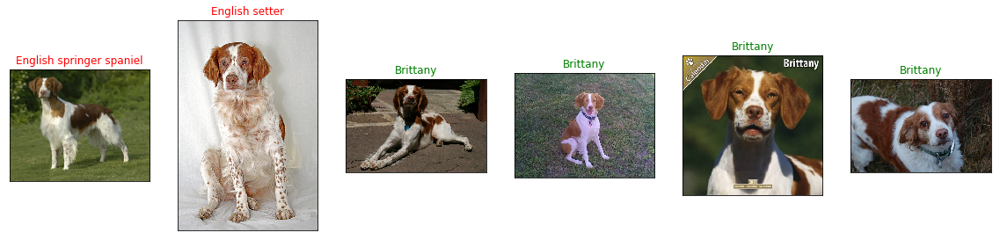

In [72]:
brittanies = glob("/data/dog_images/test/037.Brittany/*")

fig = plt.figure(figsize = (20,20))

for index, image in enumerate(brittanies):
    
    img = Image.open(image).convert('RGB')
    predicted_label = predict_breed_transfer(image)

    ax = fig.add_subplot(1, 6, index + 1, xticks=[], yticks=[])
    plt.imshow(img)
    
    ax.set_title(predicted_label, color=("green" if predicted_label == "Brittany" else "red"))

---
<a id='step5'></a>
## Step 5: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `human_detector` functions developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [105]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.
    
def run_app(img_path):
    
    if dog_detector(img_path):
        breed = predict_breed_transfer(img_path)
        messages = f"Bark, bark", f"Bark, bark {breed}"
    
    #if human is detected
    elif face_detector(img_path):
        breed = predict_breed_transfer(img_path)
        messages =  "Hello human", f"You look like a ... {breed}"
        
    else:
        messages = "Hmm ...", "I don't know you ..."
        
    img = Image.open(img_path).convert('RGB')
    
    plt.imshow(img)
    plt.title(messages[0])
    plt.xlabel(messages[1])
    plt.show()
        
    
    
def run_app_v2(img_path):
    ## handle cases for a human face, dog, and neither
    
    breed = None
    
    if dog_detector(img_path):
        breed = predict_breed_transfer(img_path)
        messages = f"Bark, bark", f"Bark, bark {breed}"
    
    #if human is detected
    elif face_detector(img_path):
        breed = predict_breed_transfer(img_path)
        messages =  "Hello human", f"You look like a ... {breed}"
        
    else:
        messages = "Hmm ...", "I don't know you ..."
        
    return messages, breed

In [95]:
def get_sample_dog(breed):
    breed = breed.replace(" ", "_")
    return glob(f"/data/dog_images/train/*{breed}/*")[0]

In [89]:
random.shuffle(dog_files)
random.shuffle(human_files)

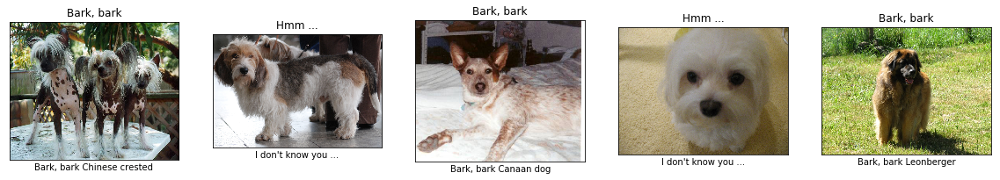

In [83]:
fig = plt.figure(figsize = (20,20))

for index, img_path in enumerate(dog_files[:5]):
    
    messages, _ = run_app_v2(img_path)
    
    img = Image.open(img_path).convert('RGB')
    
    ax = fig.add_subplot(1, 5, index +1, xticks=[], yticks=[])    
    plt.imshow(img)
    
    ax.set_title(messages[0])
    ax.set_xlabel(messages[1])

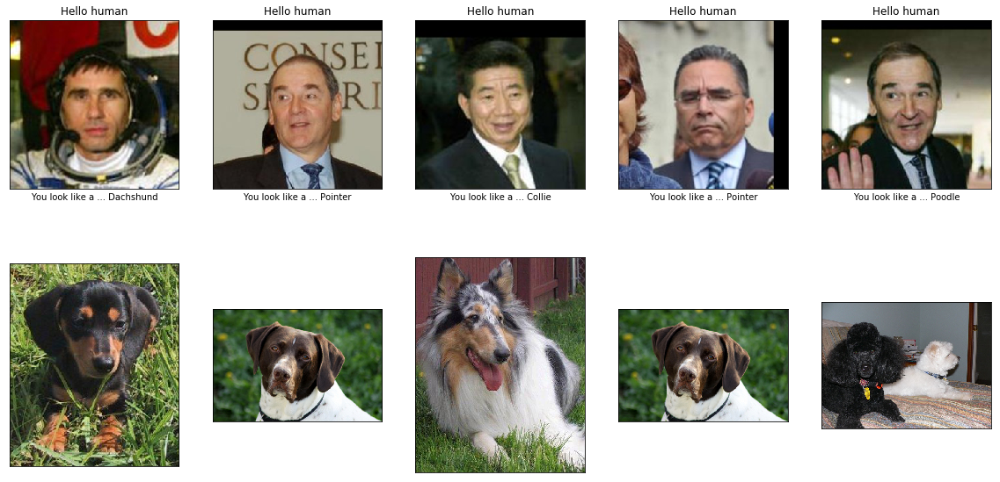

In [98]:
fig = plt.figure(figsize = (20,20))

for index, img_path in enumerate(human_files[:5]):
    
    messages, breed = run_app_v2(img_path)
    
    img = Image.open(img_path).convert('RGB')
    
    ax = fig.add_subplot(1, 5, index +1, xticks=[], yticks=[])    
    plt.imshow(img)
    
    ax.set_title(messages[0])
    ax.set_xlabel(messages[1])
    
    if breed is not None:
        img = Image.open(get_sample_dog(breed))
        ax = fig.add_subplot(2, 5, index + 6, xticks=[], yticks=[])
        plt.imshow(img)

---
<a id='step6'></a>
## Step 6: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ 

The output is surprisingly good considering that the VGG network was not trained with only dogs in mind but the feature extraction is so good that we can take advantage of it to different problems. It's definetely better than I expected.

To get better results with the algorithm we could:

* Use data augmentation to generate more data with the input images, not only do it on the batch loading process but multiply the size of the training dataset with multiple transformations

* Use a more complex architecture ant train the model for more epochs. For this exercise we only changed the output nodes of the pretrained network and we trained it only for a limited number of epochs mostly because of the time it takes to train. We can also train the 

* Ensemble different models to combine the outputs. For example, one model could use transfer learning from VGG, other from ResNet and other from Alexnet. Each net can detect its own set of features and the combination could lead to better results.

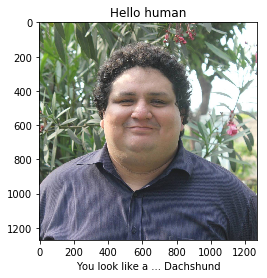

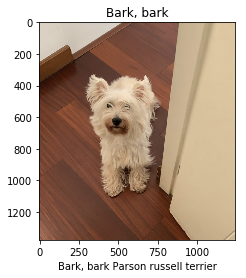

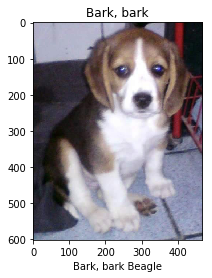

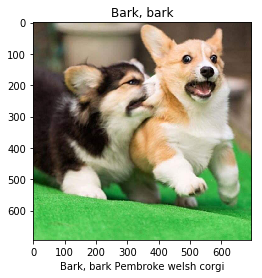

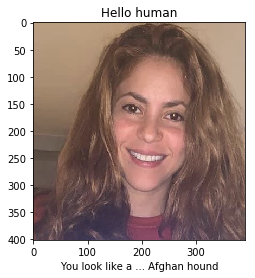

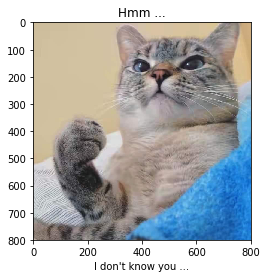

In [111]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.


## suggested code, below
for file in glob("test_images/*"):
    run_app(file) 

So apparently, according to the model, the dog version of Shakira looks like this

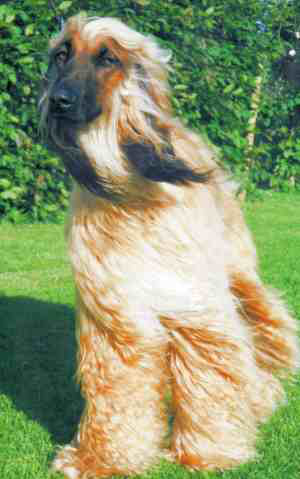

In [107]:
Image.open(get_sample_dog("Afghan_hound"))

Nice dance moves